# Mesopelagic mixture model

This notebook contains an walk through of the "mesopelagic_mixture" example script provided in the [APESExamples repository](https://github.com/ElOceanografo/APESExamples/tree/main) which applies the Bayesian inversion model using the PobabilisticEchoInversion package in Julia using simulated mixed assemblages of hake, myctophids, siphonophoes, shrimp, and squid. In addition to acoustic data, this example includes setting priors based on additional observations, such as video or eDNA datasets. For additional details, see see [Urmy et al., 2023](https://doi.org/10.1093/icesjms/fsad102).

### 1. Set up environment

Activate and load Julia environment and associated packages

In [1]:
using Pkg
Pkg.activate()

using ProbabilisticEchoInversion
using Turing
using Random
using SDWBA
using Dierckx
using LinearAlgebra
using Plots, StatsPlots, Plots.PlotMeasures
using DataFrames, DataFramesMeta, CategoricalArrays

include(joinpath(@__DIR__, "../src/bubbles.jl"))

  Activating project at `/opt/julia/environments/v1.11`


### 2. Define frequency domain and scattering models

This analysis will compare inversion results from narrowband and broadband datasets. TS responses for all of the species in the mixture are modeled using the target_strength function in the SDWBA Julia package with some simple parameterization.

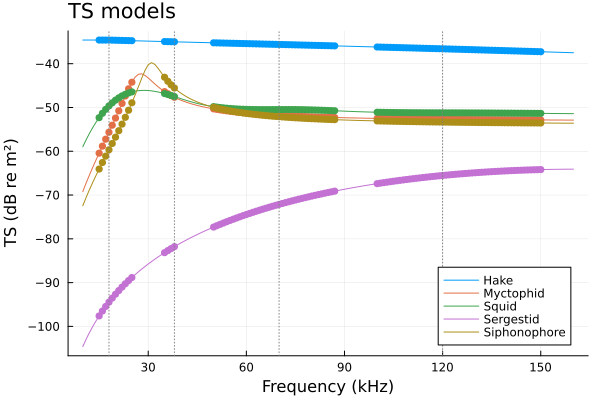

In [4]:
# Define broadband frequencies
freqs_bb = [15:25; 35:38; 50:87; 100:150]

# Define narrowband frequencies
freqs_nb = [18, 38, 70, 120]

# Define frequencies for plotting
freqs_plot = 10:160

# Find indices of narrowband frequencies in broadband frequencies
i_nb = indexin(freqs_nb, freqs_bb)

# Set depth value
depth = 300.0

# Define frequencies and target strengths for hake
freqs_hake = [18, 38, 70, 120, 200]
TS_hake = [-34.6, -35.0, -35.6, -36.6, -38.5]

# Create spline interpolation for hake target strengths
spline_hake = Spline1D(freqs_hake, TS_hake)

# Define bubble models for myctophid and siphonophore
b_myctophid = Bubble(0.00065, depth=depth, δ=0.3)
b_siphonophore = Bubble(0.00058, depth=depth, δ=0.2)

# Resize sergestid model
sergestid = resize(Models.krill_mcgeehee, 0.045)

# Define frequencies and target strengths for squid
freqs_squid = [5, 18, 38, 70, 90, 120, 150, 200] .+ 5
TS_squid = [-45, -33, -34.7, -36.5, -37., -37.25, -37.4, -37.5] .+ 10log10(0.2^2)

# Create spline interpolation for squid target strengths
spline_squid = Spline1D(freqs_squid, TS_squid)

# Define functions to calculate target strengths for different species
ts_hake(freq) = spline_hake(freq) # target_strength(b_hake, freq*1e3)
ts_myctophid(freq) = target_strength(b_myctophid, freq*1e3)
ts_siph(freq) = target_strength(b_siphonophore, freq*1e3)
ts_sergestid(freq) = target_strength(sergestid, freq*1e3, 1470)
ts_squid(freq) = spline_squid(freq)

# Calculate target strengths for broadband frequencies
TS_bb = [ts_hake.(freqs_bb) ts_myctophid.(freqs_bb) ts_squid.(freqs_bb) ts_sergestid.(freqs_bb) ts_siph.(freqs_bb)]

# Extract target strengths for narrowband frequencies
TS_nb = TS_bb[i_nb, :]

# Calculate target strengths for plotting frequencies
TS_plot = [ts_hake.(freqs_plot) ts_myctophid.(freqs_plot) ts_squid.(freqs_plot) ts_sergestid.(freqs_plot) ts_siph.(freqs_plot)]

# Convert target strengths from dB to sigmaBS
Σ_bb = exp10.(TS_bb / 10)
Σ_nb = exp10.(TS_nb / 10)
Σ_plot = exp10.(TS_plot / 10)

# Define labels and colors for plotting
labels = ["Hake" "Myctophid" "Squid" "Sergestid" "Siphonophore"]
pal = [1 2 3 4 5]

# Create plot for target strengths showing the spectra and location of narrowband frequencies
p1 = plot(freqs_plot, TS_plot, labels=labels, color=pal, legend=:bottomright,
    xlabel="Frequency (kHz)", ylabel="TS (dB re m²)", title="TS models",
    titlealign=:left)
scatter!(p1, freqs_bb, TS_bb, label="", color=pal, markerstrokewidth=0)
vline!(p1, freqs_nb, linestyle=:dot, color=:grey, label="")

### 3a. Generate simulated volume backscattering

This example uses a single set of density estimates to simulate Sv, before exploring different scenarios based on the included priors.

The input density vector `N` represents the simulated densities (in order) of Hake, myctophid, squid, shrimp, and siphonophores, which is used to create a single estimate of frequency-dependent volume backscattering according to the TS relationships defined above.


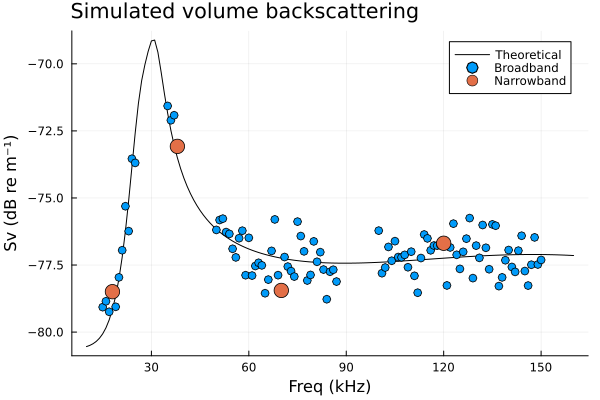

In [5]:
# Set the random seed for reproducibility
Random.seed!(123)

# Define the density (per 100 m³, divided by 100 to get m⁻³). No squid.
N = [0.25, 10, 0.0, 170, 7] / 100

# Calculate the mean volume backscattering strength (in linear space) for broadband frequencies
sv_bb = mean(rand.(Rayleigh.(Σ_bb * N / sqrt(π/2))) for _ in 1:10)

# Convert the mean volume backscattering strength to dB
Sv_bb = 10log10.(sv_bb)

# Extract the volume backscattering strength at the narrowband frequencies
sv_nb = sv_bb[i_nb]
Sv_nb = Sv_bb[i_nb]

# Calculate the theoretical volume backscattering strength for plotting frequencies based on the defined densities
Sv_plot = 10log10.(Σ_plot * N)

# Create a plot for the simulated volume backscattering
p2 = plot(freqs_plot, Sv_plot .- 20, color=:black, label="Theoretical",
    xlabel="Freq (kHz)", ylabel="Sv (dB re m⁻¹)", titlealign=:left, title="Simulated volume backscattering")
scatter!(p2, freqs_bb, Sv_bb .- 20, marker=:o, label="Broadband", color=1)
scatter!(p2, freqs_nb, Sv_nb .- 20, markersize=8, color=2, label="Narrowband")

### 3b. Define simulation scenarios
We then establish four scenarios in which different data are included in the model priors:
 1. Acoustic only
 2. Acoustic + inclusion of shrimp and siphonophore video survey
 3. Acoustic + eDNA sampling indicating no squid
 4. Acoustic + both additional sampling results

The priors will be derived from normal distributions based on the density estimates, with the mean (`μ`) derived from those inputs (except where values are 0), and a fairly large standard deviation. Each input prior is a vector of length species (corresponding to the length of both `N` and `Σ` variables above) with each element being a univariate continuous distribution represented by μ and σ.

In [14]:
# Vague, but slightly restrictive priors
T = Distribution{Univariate, Continuous}
μprior1 = log10.(max.(N, 0.0025))
prior1 = T[Normal(μ, 2.0) for μ in μprior1]

# Add estimate of sergestid and siphonophore density from ROV survey
prior2 = copy(prior1)
prior2[4] = Normal(log10(N[4]), 0.06)
prior2[5] = Normal(log10.(N[5]), 0.06)

# Did eDNA sampling, found no squid
prior3 = copy(prior1)
prior3[3] = Normal(log10(1e-9), 0.01)

# Video and eDNA sampling
prior4 = copy(prior2)
prior4[3] = Normal(log10(1e-9), 0.01)

priors = [prior1, prior2, prior3, prior4]
scenarios = ["Acoustics\nonly", "Video", "eDNA", "Video\n+eDNA"];

### 4. Define and run the inversion model

In [19]:
@model function echomodel(data, params)
    # Convert target strength (TS) to backscattering cross-section (σbs)
    Σbs = exp10.(params.TS ./ 10)
    # Define the noise parameter ϵ with an Exponential distribution
    ϵ ~ Exponential(1.0)
    # Define the log-normal distribution for the number density
    logn ~ arraydist(params.priors)
    # Convert log-normal values to linear scale
    n = exp10.(logn)
    # Calculate the predicted volume backscattering strength (Sv)
    Sv_pred = 10log10.(Σbs * n)
    # Model the observed backscatter data as normally distributed around Sv_pred
    data.backscatter .~ Normal.(Sv_pred, ϵ)
    # Return the predicted Sv values for plotting, adding random noise
    return 10log10.(params.Σ_plot * n) .+ ϵ .* randn(size(params.Σ_plot, 1))
end;

#### Run the model

We will run two versions, one with narrowband data and one with broadband data

In [20]:
# Define the broadband data inputs
data_bb = (backscatter=Sv_bb, freqs=freqs_bb, coords=(depth,))

# Define the narrowband data inputs
data_nb = (backscatter=Sv_nb, freqs=freqs_nb, coords=(depth,))

# Define the MCMC solver with NUTS sampler, 4 chains, and 2500 samples (small example)
solver = MCMCSolver(sampler=NUTS(0.9), nchains=4, nsamples=2500, kwargs=(progress=true,))

# Run the MCMC solver for each set of priors
chains = map(priors) do p
    # Define the parameters for narrowband data
    params_nb = (TS = TS_nb, priors=p, Σ_plot = Σ_plot)
    # Define the parameters for broadband data
    params_bb = (TS = TS_bb, priors=p, Σ_plot = Σ_plot)
    
    # Solve the model for narrowband data
    chain_nb = solve(data_nb, echomodel, solver, params_nb)
    # Solve the model for broadband data
    chain_bb = solve(data_bb, echomodel, solver, params_bb)
    
    # Return the chains for both narrowband and broadband data
    return (nb = chain_nb, bb = chain_bb)
end;

Sampling (Chain 1 of 4): 100%|██████████████████████████| Time: 0:00:07
Sampling (Chain 2 of 4): 100%|██████████████████████████| Time: 0:00:06
Sampling (Chain 3 of 4): 100%|██████████████████████████| Time: 0:00:09
Sampling (Chain 4 of 4): 100%|██████████████████████████| Time: 0:00:05
Sampling (Chain 1 of 4): 100%|██████████████████████████| Time: 0:00:18
Sampling (Chain 2 of 4): 100%|██████████████████████████| Time: 0:00:09
Sampling (Chain 3 of 4): 100%|██████████████████████████| Time: 0:00:09
Sampling (Chain 4 of 4): 100%|██████████████████████████| Time: 0:00:09
Sampling (Chain 1 of 4): 100%|██████████████████████████| Time: 0:00:07
Sampling (Chain 2 of 4): 100%|██████████████████████████| Time: 0:00:08
Sampling (Chain 3 of 4): 100%|██████████████████████████| Time: 0:00:06
Sampling (Chain 4 of 4): 100%|██████████████████████████| Time: 0:00:08
Sampling (Chain 1 of 4): 100%|██████████████████████████| Time: 0:00:06
Sampling (Chain 2 of 4): 100%|██████████████████████████| Time: 

### 5. Investigate model output

We can look at the MCMC diagnostic plots by scenario. For example, here we can show the result from one of the four chains. For ϵ and each species (1-5), the plots you generate below indicate the values as a function of iteration (left) and the probability distribution of the model result (either ϵ or log density). Each of the four lines represent the four scenarios (blue, red, green, purple corresponding to acoustic, acoustic+video, acoustic+eDNA, all). Two complete sets of plots are shown, the first from the narrowband model and the second from the broadband model.


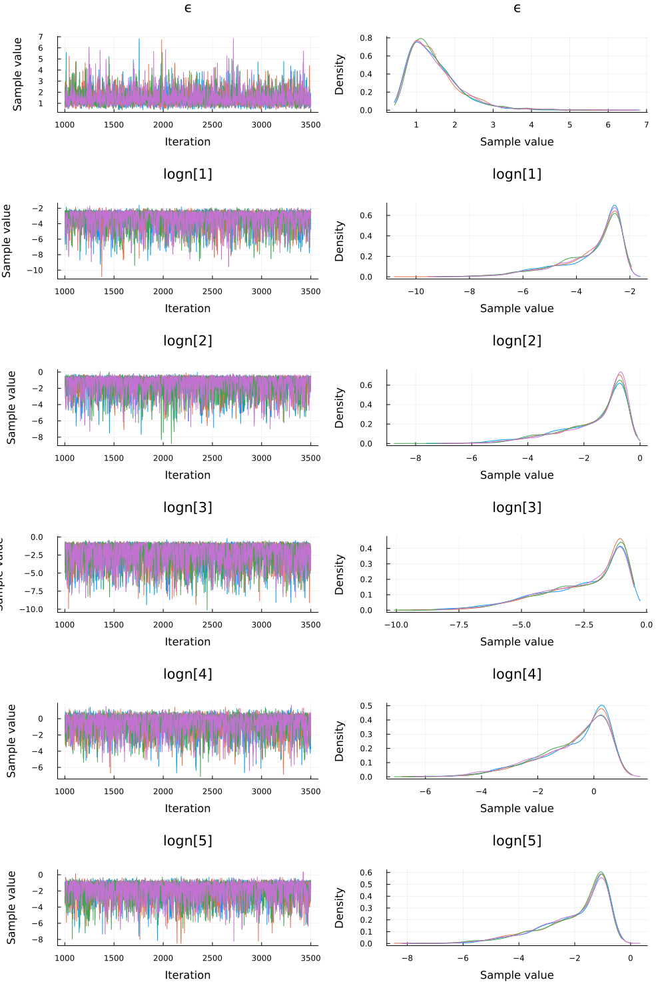

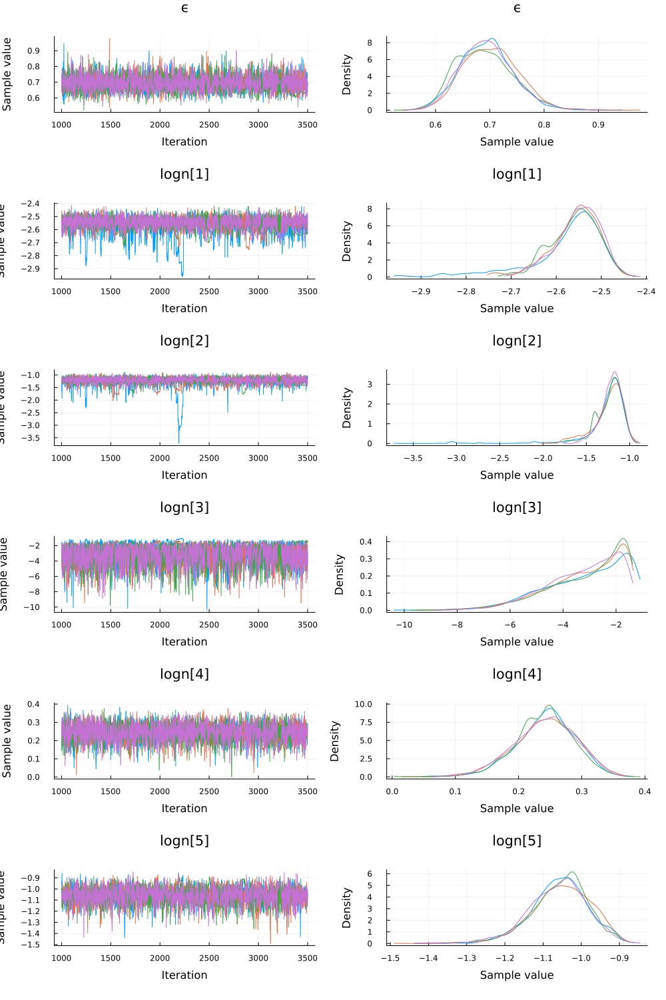

In [23]:
# MCMC diagnostic plots
scenario = 1
chn = chains[scenario]
for bandwidth in [:nb, :bb]
    p = plot(chn[bandwidth], margin=20px)
    str = replace.(scenarios, "\n" => "_")[scenario]
    display(p)
end

We can condense the ouput to a table (`posteriors`). Here the dataframe has 400000 entires (5 scatterer types, 2 bandwidths, 4 scenarios, 4 MCMC chains, 2500 iterations per chain).

In [69]:
posteriors = map(enumerate(chains)) do (i, chn)
    df_bb = DataFrame((Array(group(chn.bb, :logn))), vec(labels))
    df_bb[!, :bandwidth] .= "Broadband"
    df_nb = DataFrame((Array(group(chn.nb, :logn))), vec(labels))
    df_nb[!, :bandwidth] .= "Narrowband"
    df = [df_bb; df_nb]
    df[!, :scenario] .= scenarios[i]
    return df
end
posteriors = @chain vcat(posteriors...) begin
    DataFrames.stack( Not([:scenario, :bandwidth]), variable_name=:scatterer, value_name=:density)
    @transform(:scenario = CategoricalArray(:scenario, levels=scenarios, ordered=true))
end;
display(first(posteriors,5))

Row,bandwidth,scenario,scatterer,density
,String,Cat…,String,Float64
1,Broadband,Acoustics\nonly,Hake,-2.57734
2,Broadband,Acoustics\nonly,Hake,-2.54976
3,Broadband,Acoustics\nonly,Hake,-2.61143
4,Broadband,Acoustics\nonly,Hake,-2.65178
5,Broadband,Acoustics\nonly,Hake,-2.61252


Below, the distributions of ptredicted densities from the posterior table are visualized violin plots comparing the signal type and scenario by scatterer.

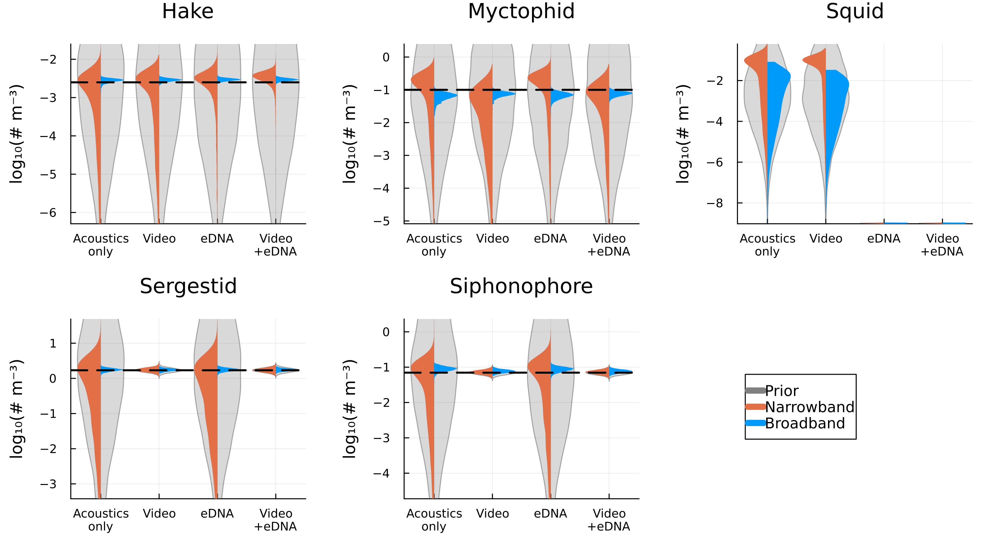

In [71]:
yl = [quantile((df.density), [0.01, 1]) for df in groupby(posteriors, :scatterer)]

subplots = map(enumerate(unique(posteriors.scatterer))) do (i, scatterer)
    post = @subset(posteriors, :scatterer .== scatterer)
    prior_sample = [rand(prior[i], 10_000) for prior in priors]
    p = violin(prior_sample, color=:grey, alpha=0.3, ylabel="log₁₀(# m⁻³)", ylims=yl[i])
    @df @subset(post, :bandwidth .== "Narrowband") violin!(p, :scenario, :density, group=:scenario,
        color=2, side=:left, linewidth=0, legend=false, title=scatterer)
    @df @subset!(post, :bandwidth .== "Broadband") violin!(p, :scenario, :density, side=:right, 
        linewidth=0, color=1)
    hline!(p, [log10(N[i])], color=:black, linestyle=:dash, linewidth=2, label="")
    return p
end
push!(subplots,
    plot(ones(1,3), labels=["Prior" "Narrowband" "Broadband"], linewidth=10,
         color=[:grey 2 1], legend=:left, xaxis=false, xticks=false,
         yaxis=false, yticks=false, ylabel="", legend_font_pointsize=10))
d10 = plot(subplots..., size=(1000, 550), dpi=300, margin=5mm)
#savefig(joinpath(@__DIR__, "plots/Fig_6_meso_mix_posteriors.png"))
display(d10)

Using the output from each chain, we can generate a predicted frequency-dependent volume backscattering. 

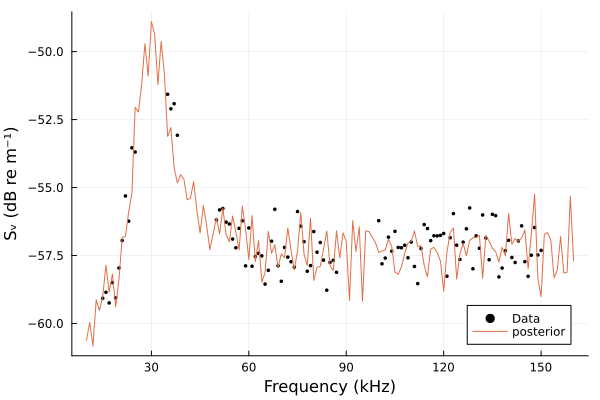

In [137]:
# Generate posterior predictive distributions for each scenario
ppreds = map(1:4) do i
    # Define parameters for narrowband data
    params_nb = (TS = TS_nb, priors=priors[i], Σ_plot=Σ_plot)
    # Define parameters for broadband data
    params_bb = (TS = TS_bb, priors=priors[i], Σ_plot=Σ_plot)
    
    # Generate quantities for both narrowband and broadband data using the echomodel
    (bb = generated_quantities(echomodel(data_bb, params_bb), chains[i].bb) |> vec,
     nb = generated_quantities(echomodel(data_nb, params_nb), chains[i].nb) |> vec)
end

p = scatter(freqs_bb, Sv_bb, markersize=2, color=:black, 
        xlabel="Frequency (kHz)", ylabel="Sᵥ (dB re m⁻¹)", label="Data", legend=:bottomright)
#!plot(ppreds[1][1])
plot!(freqs_plot,ppreds[1].bb[200],label="posterior")

We can average and generate 95% CIs of the predicted Sv responses to compare with the input data.

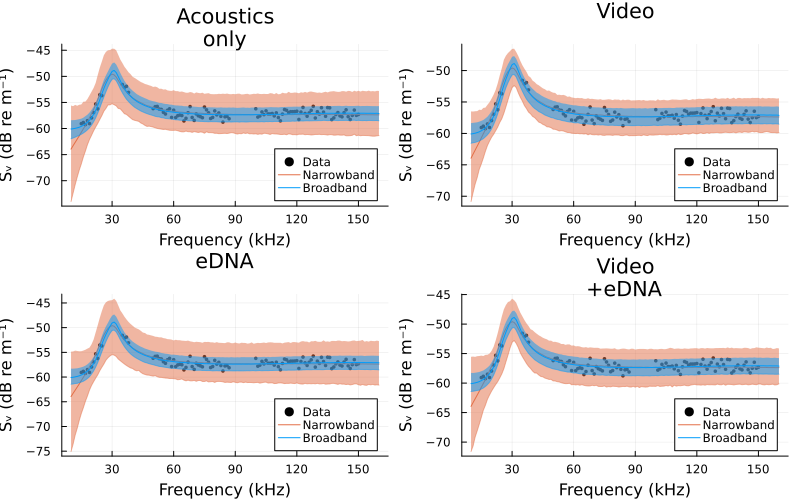

In [138]:
# Create plots for posterior predictive distributions
post_pred_plots = map(1:4) do i
    # Create a scatter plot for the observed broadband data
    p = scatter(freqs_bb, Sv_bb, markersize=2, color=:black, 
        xlabel="Frequency (kHz)", ylabel="Sᵥ (dB re m⁻¹)",
        title=scenarios[i], label="Data", legend=:bottomright)
    
    # Add the 95% CI for the narrowband predictions
    plot!(p, freqs_plot, vec(mapslices(x -> quantile(x, 0.025), hcat(ppreds[i].nb...), dims=2)),
        fillrange=vec(mapslices(x -> quantile(x, 0.975), hcat(ppreds[i].nb...), dims=2)),
        alpha=0.5, color=2, label="")
    
    # Add the mean narrowband prediction
    plot!(p, freqs_plot, mean(ppreds[1].nb), color=2, label="Narrowband")
    
    # Add the 95% CI for the broadband predictions
    plot!(p, freqs_plot, vec(mapslices(x -> quantile(x, 0.025), hcat(ppreds[i].bb...), dims=2)),
        fillrange=vec(mapslices(x -> quantile(x, 0.975), hcat(ppreds[i].bb...), dims=2)),
        alpha=0.5, color=1, label="")
    
    # Add the mean broadband prediction
    plot!(p, freqs_plot, mean(ppreds[1].bb), color=1, label="Broadband")
    
    # Return the plot
    return p
end

d11 = plot(post_pred_plots..., size=(800, 500))
display(d11)